# **On the Use of Explainable Artificial Intelligence to Evaluate School Dropout**

In this paper, we applying and evaluate XAI methods to predict students in school dropout situation, considering a database of students from the Federal Institute of Rio Grande do Norte (IFRN), a Brazilian technical school.



Therefore, let's take the following steps:




1.  Load Libraries
2. Data Clean
3. Balance Data
4. Build a Black-Box Model
5. XAI Frameworks 




# 1. Load Libraries

In [ ]:
pip install -q -U keras-tuner

In [ ]:
!pip install pandas==0.25

In [ ]:
pip install -U skater

  Using cached https://files.pythonhosted.org/packages/5a/99/aa0b52e709a621dfae9fbf8359c9f1ee6d2272e7f53cd2815284e088ec74/skater-1.1.2.tar.gz
  Using cached https://files.pythonhosted.org/packages/be/8b/4e47893d91d2408028b80815a30f128e840104e5ed10999c0121f5f1a7f3/wordcloud-1.3.1.tar.gz
  Using cached https://files.pythonhosted.org/packages/4f/51/870b2ec270fc29c5d89f85353da420606a9cb39fba4747127e7c7d7eb25d/joblib-0.11-py2.py3-none-any.whl
  Using cached https://files.pythonhosted.org/packages/7f/ff/ae64bacdfc95f27a016a7bed8e8686763ba4d277a78ca76f32659220a731/Jinja2-2.10-py2.py3-none-any.whl
  ERROR: Failed building wheel for skater
  Running setup.py clean for skater
  ERROR: Failed building wheel for wordcloud
  Running setup.py clean for wordcloud
Failed to build skater wordcloud
ERROR: librosa 0.8.0 has requirement joblib>=0.14, but you'll have joblib 0.11 which is incompatible.
ERROR: flask 1.1.2 has requirement Jinja2>=2.10.1, but you'll have jinja2 2.10 which is incompatible.
ERRO

In [ ]:
!pip install shap

     |████████████████████████████████| 358kB 9.3MB/s 
  Created wheel for shap: filename=shap-0.38.1-cp37-cp37m-linux_x86_64.whl size=490497 sha256=f10917d9785df2c457ad45bee6e3d264da38fbf9cb3d00d084562372243e13aa
  Stored in directory: /root/.cache/pip/wheels/a8/fb/e4/88012be41842b9be62ae18d82d1b1e880daf8539d1fef1fa00
Successfully built shap


In [ ]:
pip install lime

     |████████████████████████████████| 276kB 8.0MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-cp37-none-any.whl size=283846 sha256=a29a28d8f1a1a5efa3681c0443e83c64a03eb95d8b3e9d781ce53cc49a81be06
  Stored in directory: /root/.cache/pip/wheels/4c/4f/a5/0bc765457bd41378bf3ce8d17d7495369d6e7ca3b712c60c89
Successfully built lime


In [ ]:
pip install eli5

     |████████████████████████████████| 112kB 8.9MB/s 


In [ ]:
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns; sns.set()
import os
from google.colab import drive
import numpy as np
import pandas as pd
import missingno as msno
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss
from scipy.spatial import distance
import scipy
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import silhouette_samples, silhouette_score
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
#from kerastuner.tuners import RandomSearch
import IPython
import shap                
import lime
import lime.lime_tabular
import eli5

The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.


# 2. Data Clean

In [ ]:
df.describe()

,Unnamed: 0,M_mean_int,M_std_int,M_25_int,M_50_int,M_75_int,F_mean_int,F_std_int,id_aluno,ano_letivo__ano,id,ensino_fundamental_conclusao,qtd_pessoas_domicilio,codigo_siape,codigo_censup,evasao,ano_nascimento,qnt_salarios,sexo,CA,CAL,CANG,CM,CN,CNAT,IP,JC,LAJ,MC,MO,NC,PAAS,PAR,PF,SC,SGA,SPP,ZN,publica,sem_estudar_sim,...,respTrabBeneficirioouPensionistadoINSS,respTrabEmpresaprivada,respTrabEstgiooubolsa,respTrabNuncatrabalhou,respTrabNoesttrabalhando,respTrabNoinformado,respTrabPescador,respTrabServiopblico,respTrabTrabalhacomvnculoempregatcio,respTrabTrabalhadorruralAgricultor,respFinCnjuge,respFinIrmo,respFinMe,respFinNoinformado,respFinOprprioaluno,respFinOutros,respFinPai,respFinParentes,respFinTioa,res_quilombola,res_nao_informado,res_rural,res_urbana,statusImovelCedidoouEmprestado,statusImovelFinanciado,statusImovelNoinformado,statusImovelOutro,statusImovelPensionatoouAlojamento,statusImovelPrprio,trabAlunoAutnomo,trabAlunoBeneficirioouPensionistadoINSS,trabAlunoEmpresaprivada,trabAlunoEstgiooubolsa,trabAlunoNuncatrabalhou,trabAlunoNoesttrabalhando,trabAlunoNoinformado,trabAlunoPescador,trabAlunoServiopblico,trabAlunoTrabalhacomvnculoempregatcio,trabAlunoTrabalhadorruralAgricultor
count,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7.342000e+03,7342.000000,7.342000e+03,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,...,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000,7342.000000
mean,3670.500000,6.186325,1.649823,5.559793,6.510896,7.422228,8.766140,0.217379,4.928816e+11,2015.807409,4.928816e+11,2014.251975,4.114002,3.253609,2.275810,0.071643,1999.833016,2.187006,0.490466,0.068646,0.024789,0.026696,0.040725,0.062653,0.160174,0.032961,0.035413,0.040180,0.040725,0.039499,0.037320,0.038682,0.060474,0.048624,0.056252,0.033914,0.055843,0.058431,0.221329,0.498910,...,0.031327,0.216426,0.003405,0.004086,0.074094,0.029147,0.003814,0.262735,0.010896,0.064832,0.008172,0.011169,0.386679,0.002452,0.004086,0.014437,0.498093,0.003814,0.011169,0.000409,0.111278,0.125034,0.763007,0.038273,0.061564,0.010215,0.033642,0.000272,0.714383,0.029011,0.004358,0.014301,0.011713,0.594116,0.180196,0.124081,0.000409,0.020158,0.001771,0.013620
std,2119.597171,1.648316,0.612797,2.158078,1.864305,1.563403,0.739589,0.563265,3.348910e+10,0.737949,3.348910e+10,1.619417,1.375520,1.698729,0.971637,0.257913,1.645842,1.627614,0.499943,0.252869,0.155492,0.161204,0.197665,0.242355,0.366793,0.178547,0.184833,0.196394,0.197665,0.194792,0.189557,0.192848,0.238379,0.215096,0.230423,0.181021,0.229634,0.234573,0.415170,0.500033,...,0.174211,0.411836,0.058257,0.063796,0.261942,0.168231,0.061641,0.440150,0.103822,0.246247,0.090036,0.105097,0.487022,0.049457,0.063796,0.119294,0.500030,0.061641,0.105097,0.020211,0.314497,0.330780,0.425267,0.191868,0.240378,0.100560,0.180318,0.016504,0.451739,0.167849,0.065879,0.118738,0.107600,0.491096,0.384377,0.329696,0.020211,0.140550,0.042045,0.115916
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,4.488734e+11,2015.000000,4.488734e+11,1971.000000,0.000000,1.000000,0.000000,0.000000,1957.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000

In [ ]:
df.columns

Index(['Unnamed: 0', 'M_mean_int', 'M_std_int', 'M_25_int', 'M_50_int',
       'M_75_int', 'F_mean_int', 'F_std_int', 'id_aluno', 'ano_letivo__ano',
       ...
       'trabAlunoBeneficirioouPensionistadoINSS', 'trabAlunoEmpresaprivada',
       'trabAlunoEstgiooubolsa', 'trabAlunoNuncatrabalhou',
       'trabAlunoNoesttrabalhando', 'trabAlunoNoinformado',
       'trabAlunoPescador', 'trabAlunoServiopblico',
       'trabAlunoTrabalhacomvnculoempregatcio',
       'trabAlunoTrabalhadorruralAgricultor'],
      dtype='object', length=137)

In [ ]:
import pandas_profiling
pandas_profiling.ProfileReport(df)

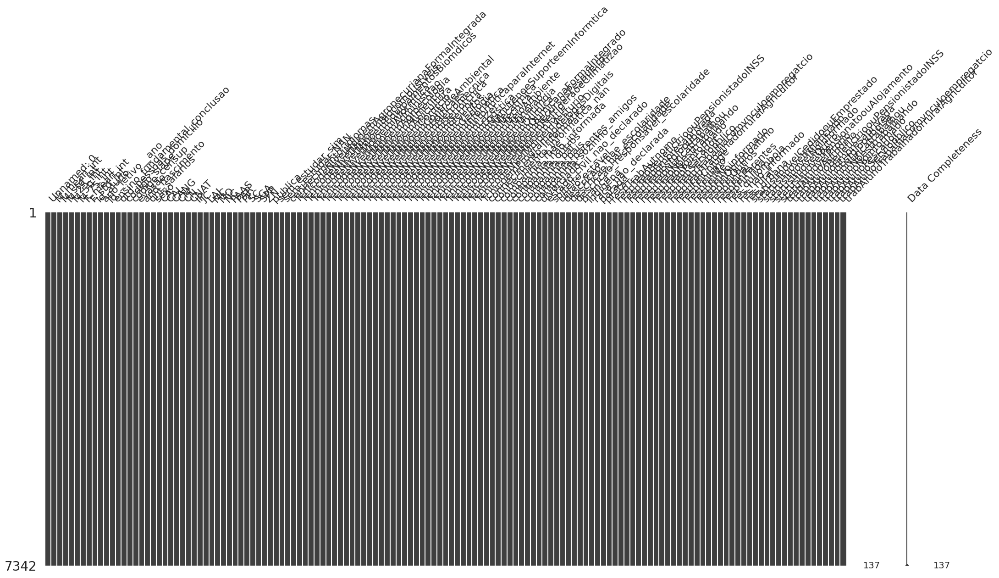

In [ ]:
msno.matrix(df, labels=True)

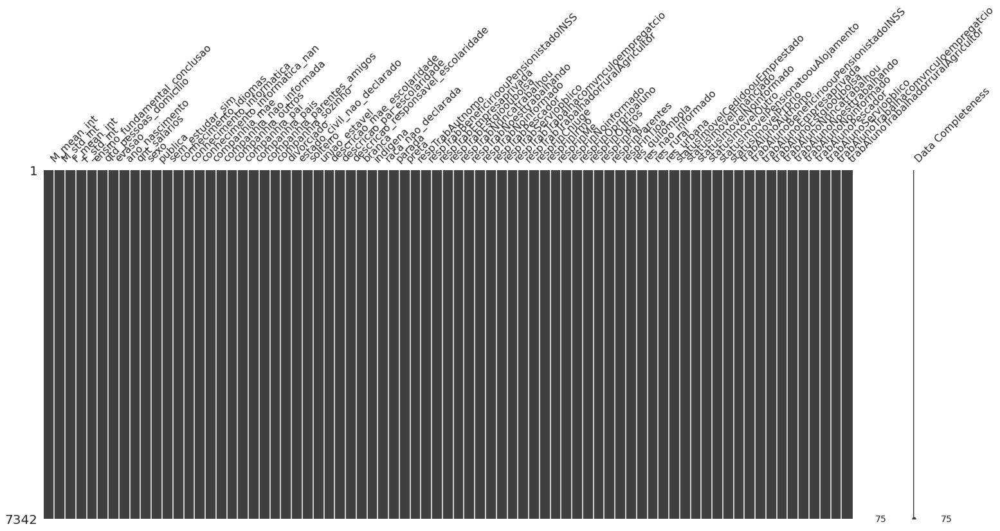

In [ ]:
colunms_cot = ['Unnamed: 0', 'M_25_int', 'M_50_int', 'M_75_int',
                  'id_aluno', 'ano_letivo__ano', 'id', 'sem_estudar_NAN',
                  'codigo_siape' , 'codigo_censup', 'CA', 'CAL', 'CANG', 'CM', 'CN', 'CNAT',
                  'IP', 'JC', 'LAJ', 'MC', 'MO', 'NC', 'PAAS', 'PAR', 'PF', 'SC', 'SGA', 'SPP',
                  'ZN', 'TcnicodeNivelMdioemAgropecurianaFormaIntegrada', 'TcnicodeNivelMdioemBiocombustveis',
                  'TcnicodeNivelMdioemEquipamentosBiomdicos', 'TcnicodeNivelMdioemInformtica',
                  'TcnicodeNvelMdioemAdministrao', 'TcnicodeNvelMdioemAgroecologia',
                  'TcnicodeNvelMdioemAlimentos', 'TcnicodeNvelMdioemApicultura',
                  'TcnicodeNvelMdioemComrcio', 'TcnicodeNvelMdioemControleAmbiental',
                  'TcnicodeNvelMdioemEdificaes', 'TcnicodeNvelMdioemEletromecnica',
                  'TcnicodeNvelMdioemEletrotcnica', 'TcnicodeNvelMdioemEletrnica',
                  'TcnicodeNvelMdioemEventos', 'TcnicodeNvelMdioemGeologia',
                  'TcnicodeNvelMdioemInformtica', 'TcnicodeNvelMdioemInformticaparaInternet',
                  'TcnicodeNvelMdioemLazer', 'TcnicodeNvelMdioemLogstica', 
                  'TcnicodeNvelMdioemMecatrnica', 'TcnicodeNvelMdioemMecnica',
                  'TcnicodeNvelMdioemMeioAmbiente', 'TcnicodeNvelMdioemMinerao',
                  'TcnicodeNvelMdioemManutenoeSuporteemInformtica', 'TcnicodeNvelMdioemMultimdia',
                  'TcnicodeNvelMdioemQumica', 'TcnicodeNvelMdioemQumicanaFormaIntegrado',
                  'TcnicodeNvelMdioemRecursosPesqueiros', 'TcnicodeNvelMdioemRefrigeraoeClimatizao',
                  'TcnicodeNvelMdioemTxtil', 'TcnicodeNvelMdioemVesturio',
                  'TcnicoemProgramaodeJogosDigitais'
                  ]
data = df.drop(columns=colunms_cot)
msno.matrix(data, labels=True)

# 3. Balance Data

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


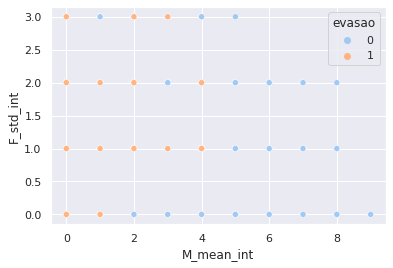

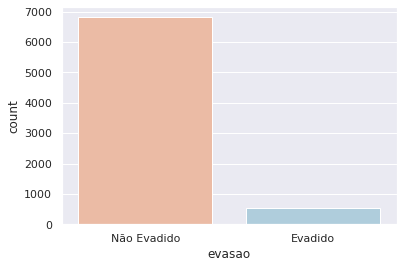

In [ ]:
sns.scatterplot(data.M_mean_int, data.F_std_int, hue=data.evasao, 
                palette="pastel")

plt.figure()
sns.countplot(x="evasao", data=data, palette='RdBu')
plt.xticks([0,1], ['Não Evadido', 'Evadido'])
plt.show()

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


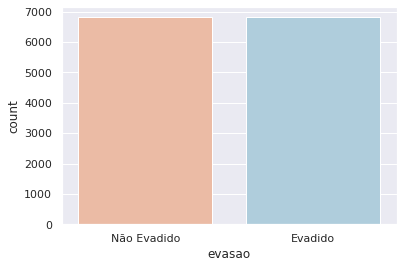

In [ ]:
# Aplicando técnica de OverSampling SMOTE

sm = SMOTE(random_state=42)

X_over, y_over = sm.fit_resample(data.drop(columns=['evasao']), data['evasao'])

# Transformando de volta em único dataframe pandas

X_over = pd.DataFrame(X_over)
y_over = pd.DataFrame(y_over)

colunas = data.columns.drop('evasao')
X_over.columns = colunas

y_over = y_over.rename({0: 'evasao'}, axis=1)

X_over['index'] = X_over.index
y_over['index'] = y_over.index

data_over = X_over.set_index('index').join(y_over.set_index('index'))
data_over = round(data_over)

plt.figure()
sns.countplot(x="evasao", data=data_over, palette='RdBu')
plt.xticks([0,1], ['Não Evadido', 'Evadido'])
plt.show()

# 4. Building a Black-box Model

In [ ]:
def print_analysis(titles,history):
  loss = ["loss", "val_loss"]
  accuracy = ["accuracy","val_accuracy"]
  f, axs = plt.subplots(1,2,figsize=(10,4))
  
  for i,item in enumerate([loss,accuracy]):
    axs[i].plot(history.history[item[0]])
    axs[i].plot(history.history[item[1]])
    axs[i].set_ylabel(item[0])
    axs[i].set_xlabel('epoch')
    axs[i].legend(['train', 'test'], loc='best')

  f.suptitle(titles, y=1.1)
  plt.tight_layout()
  plt.show()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(data_over.drop(columns='evasao'),
                                                    data_over['evasao'],
                                                    test_size=0.20,
                                                    train_size=0.80,
                                                    random_state=42)

In [ ]:
def build_model(hp):
  model = keras.Sequential()
  model.add(layers.Dense(units=hp.Int('units',
                                      min_value=25,
                                      max_value=200,
                                      step=25),
                         kernel_initializer="he_uniform"))
  model.add(tf.keras.layers.BatchNormalization(momentum=0.0))
  model.add(tf.keras.layers.Activation(tf.nn.relu))
  model.add(layers.Dense(units=hp.Int('units',
                                      min_value=25,
                                      max_value=200,
                                      step=25),
                         kernel_initializer="he_uniform"))
  model.add(tf.keras.layers.BatchNormalization(momentum=0.0))
  model.add(tf.keras.layers.Activation(tf.nn.relu))
  model.add(layers.Dense(2, activation='softmax',
                         kernel_initializer="he_uniform"))

  model.compile(
      optimizer=keras.optimizers.Adam(
          hp.Choice('learning_rate',
                    values=[1e-2, 1e-3, 1e-4])),
      loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
      metrics=['accuracy'])
  return model

In [ ]:
tuner = RandomSearch(build_model,
                     objective='val_accuracy',
                     max_trials= 5,
                     executions_per_trial=3,
                     directory='my_dir',
                     project_name='teste_mlp'
                     )

INFO:tensorflow:Reloading Oracle from existing project my_dir/teste_mlp/oracle.json
INFO:tensorflow:Reloading Tuner from my_dir/teste_mlp/tuner0.json


In [ ]:
tuner.search(X_train,
             y_train,
             epochs = 500,
             verbose= 1,
             batch_size=32,
             validation_data= (X_test, y_test),
             callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)],
             #validation_split = 0.20
             )

INFO:tensorflow:Oracle triggered exit


In [ ]:
best_hps= tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The hyperparameter search is complete. The optimal number of units in the first densely-connected
layer is {best_hps.get('units')} and the optimal learning rate for the optimizer
is {best_hps.get('learning_rate')}.
""")


The hyperparameter search is complete. The optimal number of units in the first densely-connected
layer is 200 and the optimal learning rate for the optimizer
is 0.001.



## Model

In [ ]:
model = tuner.hypermodel.build(best_hps)

history = model.fit(X_train, 
                    y_train, 
                    epochs=500, 
                    verbose= 1,
                    batch_size=32,
                    #validation_split=0.2,
                    validation_data=(X_test, y_test),
                    callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)]
                    )

val_acc_per_epoch = history.history['val_accuracy']
best_epoch = val_acc_per_epoch.index(max(val_acc_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Epoch 1/500
341/341 [==============================] - 2s 3ms/step - loss: 0.2776 - accuracy: 0.8861 - val_loss: 0.4181 - val_accuracy: 0.8306
Epoch 2/500
341/341 [==============================] - 1s 2ms/step - loss: 0.1709 - accuracy: 0.9395 - val_loss: 3.3197 - val_accuracy: 0.5057
Epoch 3/500
341/341 [==============================] - 1s 2ms/step - loss: 0.1395 - accuracy: 0.9479 - val_loss: 0.2138 - val_accuracy: 0.9267
Epoch 4/500
341/341 [==============================] - 1s 2ms/step - loss: 0.1213 - accuracy: 0.9604 - val_loss: 4.5315 - val_accuracy: 0.5369
Epoch 5/500
341/341 [==============================] - 1s 2ms/step - loss: 0.0918 - accuracy: 0.9694 - val_loss: 0.4228 - val_accuracy: 0.8988
Epoch 6/500
341/341 [==============================] - 1s 2ms/step - loss: 0.0819 - accuracy: 0.9729 - val_loss: 0.4362 - val_accuracy: 0.8185
Epoch 7/500
341/341 [==============================] - 1s 2ms/step - loss: 0.0812 - accuracy: 0.9714 - val_loss: 0.2707 - val_accuracy: 0.9036

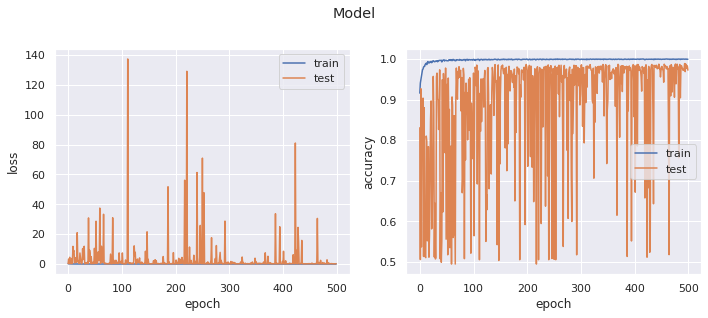

In [ ]:
print_analysis("Model",history)

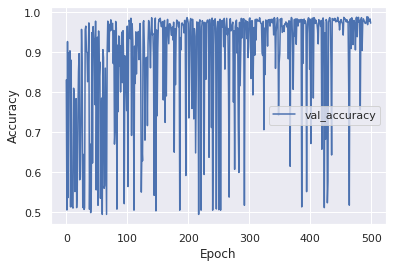

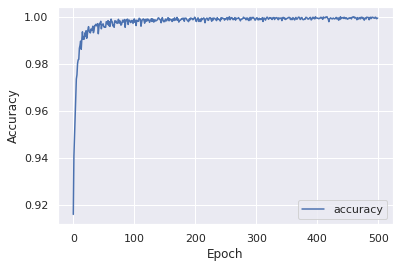

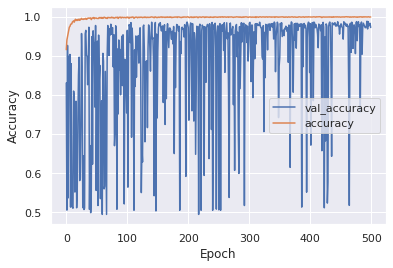

In [ ]:
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['accuracy'], label='accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.plot(history.history['accuracy'], label='accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
loss, acc = model.evaluate(X_train,y_train)
print('Train loss: %.3f - acc: %.3f' % (loss, acc))

loss_, acc_ = model.evaluate(X_test,y_test)
print('Test loss: %.3f - acc: %.3f' % (loss_, acc_))

341/341 [==============================] - 0s 1ms/step - loss: 0.0027 - accuracy: 0.9991
Train loss: 0.003 - acc: 0.999
86/86 [==============================] - 0s 1ms/step - loss: 0.2614 - accuracy: 0.9725
Test loss: 0.261 - acc: 0.972


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 200)               15000     
_________________________________________________________________
batch_normalization (BatchNo (None, 200)               800       
_________________________________________________________________
activation (Activation)      (None, 200)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               40200     
_________________________________________________________________
batch_normalization_1 (Batch (None, 200)               800       
_________________________________________________________________
activation_1 (Activation)    (None, 200)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 4

In [ ]:
tuner.results_summary(num_trials=10)

Results summary
Results in my_dir/teste_mlp
Showing 10 best trials
Objective(name='val_accuracy', direction='max')
Trial summary
Hyperparameters:
units: 200
learning_rate: 0.001
Score: 1.0
Trial summary
Hyperparameters:
units: 50
learning_rate: 0.001
Score: 1.0
Trial summary
Hyperparameters:
units: 125
learning_rate: 0.0001
Score: 1.0
Trial summary
Hyperparameters:
units: 150
learning_rate: 0.01
Score: 1.0
Trial summary
Hyperparameters:
units: 150
learning_rate: 0.0001
Score: 1.0


## HyperModel

In [ ]:
hypermodel = tuner.hypermodel.build(best_hps)

# Retrain the model
history_best = hypermodel.fit(X_train, 
                              y_train, 
                              epochs=best_epoch,
                              verbose= 1,
                              validation_data=(X_test, y_test),
                              batch_size = 32
                              )

Epoch 1/494
341/341 [==============================] - 2s 3ms/step - loss: 0.3015 - accuracy: 0.8824 - val_loss: 0.4789 - val_accuracy: 0.8423
Epoch 2/494
341/341 [==============================] - 1s 2ms/step - loss: 0.1765 - accuracy: 0.9322 - val_loss: 0.5585 - val_accuracy: 0.8416
Epoch 3/494
341/341 [==============================] - 1s 2ms/step - loss: 0.1371 - accuracy: 0.9505 - val_loss: 1.1351 - val_accuracy: 0.6267
Epoch 4/494
341/341 [==============================] - 1s 2ms/step - loss: 0.1177 - accuracy: 0.9595 - val_loss: 5.3533 - val_accuracy: 0.4958
Epoch 5/494
341/341 [==============================] - 1s 2ms/step - loss: 0.0932 - accuracy: 0.9658 - val_loss: 0.7183 - val_accuracy: 0.8376
Epoch 6/494
341/341 [==============================] - 1s 2ms/step - loss: 0.0816 - accuracy: 0.9720 - val_loss: 4.2847 - val_accuracy: 0.5387
Epoch 7/494
341/341 [==============================] - 1s 2ms/step - loss: 0.0713 - accuracy: 0.9775 - val_loss: 4.3114 - val_accuracy: 0.5031

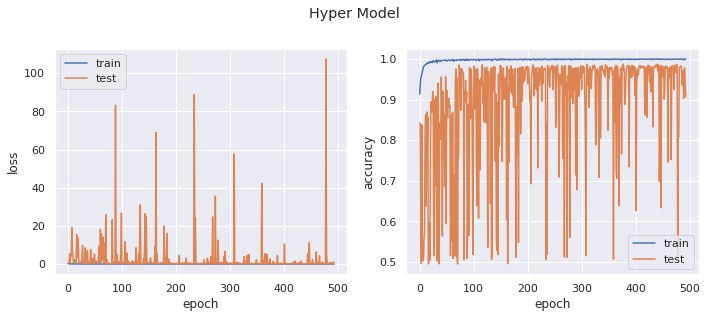

In [ ]:
print_analysis("Hyper Model",history_best)

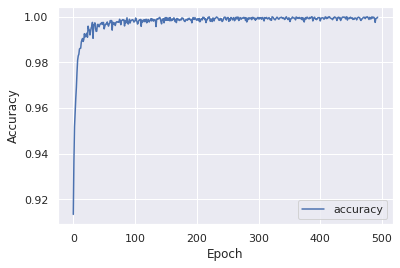

In [ ]:
plt.plot(history_best.history['accuracy'], label='accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

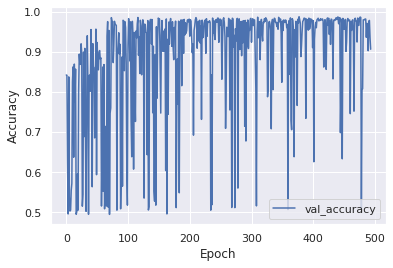

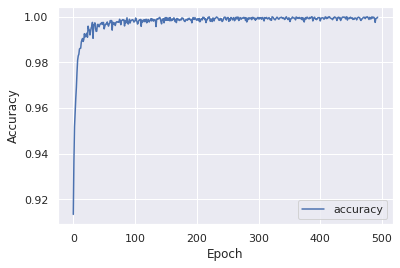

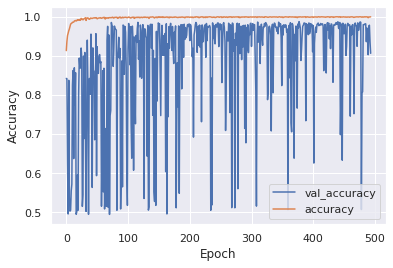

In [ ]:
plt.plot(history_best.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history_best.history['accuracy'], label='accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(history_best.history['val_accuracy'], label = 'val_accuracy')
plt.plot(history_best.history['accuracy'], label='accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
loss, acc = hypermodel.evaluate(X_train,y_train)
print('Train loss: %.3f - acc: %.3f' % (loss, acc))

loss_, acc_ = hypermodel.evaluate(X_test,y_test)
print('Test loss: %.3f - acc: %.3f' % (loss_, acc_))

341/341 [==============================] - 0s 1ms/step - loss: 0.5055 - accuracy: 0.9296
Train loss: 0.505 - acc: 0.930
86/86 [==============================] - 0s 1ms/step - loss: 0.7721 - accuracy: 0.9065
Test loss: 0.772 - acc: 0.906


In [ ]:
hypermodel.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 200)               15000     
_________________________________________________________________
batch_normalization (BatchNo (None, 200)               800       
_________________________________________________________________
activation (Activation)      (None, 200)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               40200     
_________________________________________________________________
batch_normalization_1 (Batch (None, 200)               800       
_________________________________________________________________
activation_1 (Activation)    (None, 200)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 4

## Confusion Matrix

Text(89.18, 0.5, 'Predicted label')

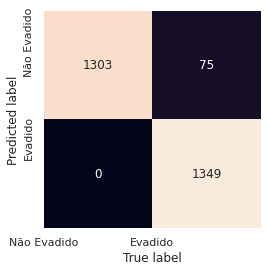

In [ ]:
predicoes = model.predict(X_test)

predicoes_ = []

for i in range(len(predicoes)):
  predicoes_.append(np.argmax(predicoes[i]))
mat = tf.math.confusion_matrix(y_test, predicoes_)

sns.heatmap(mat, square=True, annot=True, fmt='d', cbar=False)
plt.xticks([0,1], ['Não Evadido', 'Evadido'])
plt.yticks([0,1], ['Não Evadido', 'Evadido'])
plt.xlabel('True label')
plt.ylabel('Predicted label')

Text(89.18, 0.5, 'Predicted label')

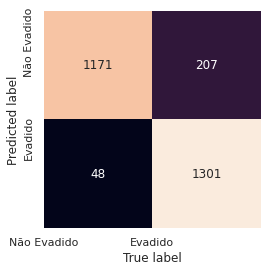

In [ ]:
predicoes = hypermodel.predict(X_test)

predicoes_ = []

for i in range(len(predicoes)):
  predicoes_.append(np.argmax(predicoes[i]))
mat = tf.math.confusion_matrix(y_test, predicoes_)

sns.heatmap(mat, square=True, annot=True, fmt='d', cbar=False)
plt.xticks([0,1], ['Não Evadido', 'Evadido'])
plt.yticks([0,1], ['Não Evadido', 'Evadido'])
plt.xlabel('True label')
plt.ylabel('Predicted label')

# 5. XAI Frameworks

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df.drop(columns='evasao'),
                                                    df['evasao'],
                                                    test_size=0.20,
                                                    train_size=0.80,
                                                    random_state=42)

In [ ]:
new_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 200)               15000     
_________________________________________________________________
batch_normalization (BatchNo (None, 200)               800       
_________________________________________________________________
activation (Activation)      (None, 200)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 200)               40200     
_________________________________________________________________
batch_normalization_1 (Batch (None, 200)               800       
_________________________________________________________________
activation_1 (Activation)    (None, 200)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 2)                 4

## LIME

Text(89.18, 0.5, 'Predicted label')

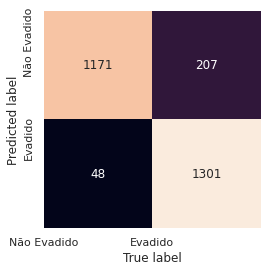

In [ ]:
predicoes = new_model.predict(X_test)

predicoes_ = []

for i in range(len(predicoes)):
  predicoes_.append(np.argmax(predicoes[i]))
mat = tf.math.confusion_matrix(y_test, predicoes_)

sns.heatmap(mat, square=True, annot=True, fmt='d', cbar=False)
plt.xticks([0,1], ['Não Evadido', 'Evadido'])
plt.yticks([0,1], ['Não Evadido', 'Evadido'])
plt.xlabel('True label')
plt.ylabel('Predicted label')

In [ ]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train, 
                                                   class_names=['Não Evadido','Evadido'],
                                                   feature_names = X_train.columns,
                                                   discretize_continuous=False)

In [ ]:
for i in range (len(predicoes_)):
  if y_test.iloc[i] == 1 and predicoes_[i] == 1:
    print(i)
    break;

0


In [ ]:
exp_0_0 = explainer.explain_instance(X_test.iloc[2], 
                                     new_model.predict_proba,
                                     num_features=12)
exp_0_0.show_in_notebook(show_table=True, show_all=False)

`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.


In [ ]:
exp_0_1 = explainer.explain_instance(X_test.iloc[6], 
                                 new_model.predict_proba,
                                  num_features=12)
exp_0_1.show_in_notebook(show_table=True, show_all=False)

`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.


In [ ]:
exp_1_0 = explainer.explain_instance(X_test.iloc[56], 
                                 new_model.predict_proba,
                                  num_features=12)
exp_1_0.show_in_notebook(show_table=True, show_all=False)

`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.


In [ ]:
exp_1_1 = explainer.explain_instance(X_test.iloc[0], 
                                 new_model.predict_proba,
                                  num_features=12)
exp_1_1.show_in_notebook(show_table=True, show_all=False)

`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.


## Shapley Values

In [ ]:
X_train_shap = shap.kmeans(X_train, 80)
X_test_shap = shap.kmeans(X_test, 20)

In [ ]:
explainer = shap.KernelExplainer(new_model.predict_proba, X_test_shap)

`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.


In [ ]:
# True positive

shap_values_ex_1_1 = explainer.shap_values(X_test.iloc[0,:])

`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values_ex_1_1[0],X_test.iloc[0,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_ex_1_1[0],X_test.iloc[0,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_ex_1_1[1],X_test.iloc[0,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values_ex_1_1[1],X_test.iloc[0,:])

In [ ]:
# False positive

shap_values_ex_1_0 = explainer.shap_values(X_test.iloc[56,:])

`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values_ex_1_0[0],X_test.iloc[56,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_ex_1_0[0],X_test.iloc[56,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values_ex_1_0[1],X_test.iloc[56,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_ex_1_0[1],X_test.iloc[56,:])

In [ ]:
# True negative

shap_values_ex_0_0 = explainer.shap_values(X_test.iloc[2,:])

`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_ex_0_0[1],X_test.iloc[2,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values_ex_0_0[1],X_test.iloc[2,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_ex_0_0[0],X_test.iloc[2,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values_ex_0_0[0],X_test.iloc[2,:])

In [ ]:
# False positive

shap_values_ex_0_1 = explainer.shap_values(X_test.iloc[6,:])

`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.


In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_ex_0_1[1],X_test.iloc[6,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values_ex_0_1[1],X_test.iloc[6,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values_ex_0_1[0],X_test.iloc[6,:])

In [ ]:
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_values_ex_0_1[0],X_test.iloc[6,:])

## SHAP

In [ ]:
shap_values_test = explainer.shap_values(X_test, l1_reg="aic")

`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `model.predict()` instead.
`model.predict_proba()` is deprecated and will be removed after 2021-01-01. Please use `

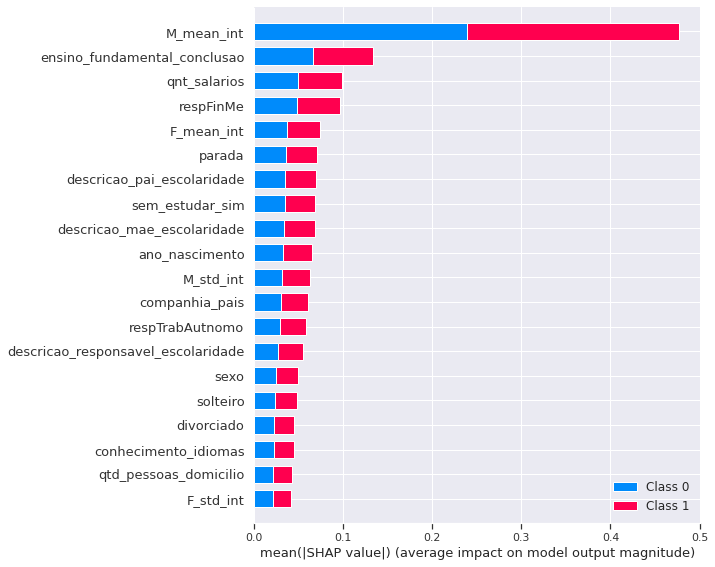

In [ ]:
shap.summary_plot(shap_values_test, X_test)

not enough data in bin #12 for feature qtd_pessoas_domicilio, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #13 for feature qtd_pessoas_domicilio, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #14 for feature qtd_pessoas_domicilio, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #15 for feature qtd_pessoas_domicilio, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #16 for feature qtd_pessoas_domicilio, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #17 for feature qtd_pessoas_domicilio, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #0 for feature descricao_mae_escolaridade, so it'll be ignored. Try increasing the number of records to plot.


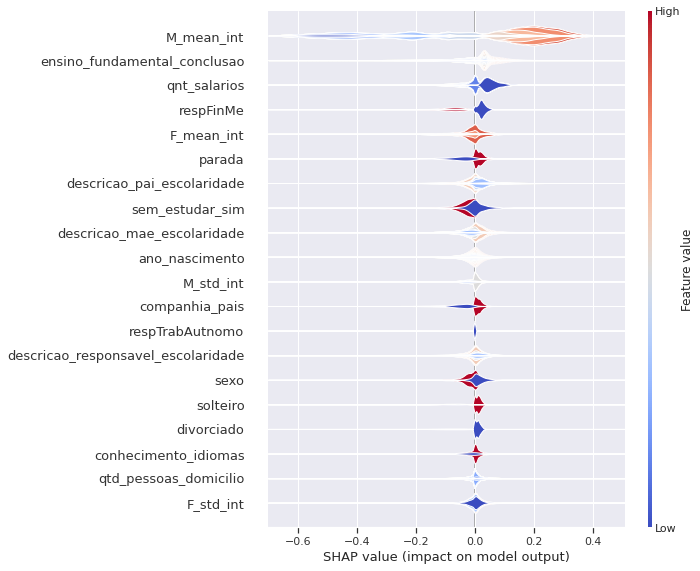

In [ ]:
shap.summary_plot(shap_values_test[0], X_test, plot_type="layered_violin")

not enough data in bin #12 for feature qtd_pessoas_domicilio, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #13 for feature qtd_pessoas_domicilio, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #14 for feature qtd_pessoas_domicilio, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #15 for feature qtd_pessoas_domicilio, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #16 for feature qtd_pessoas_domicilio, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #17 for feature qtd_pessoas_domicilio, so it'll be ignored. Try increasing the number of records to plot.
not enough data in bin #0 for feature descricao_mae_escolaridade, so it'll be ignored. Try increasing the number of records to plot.


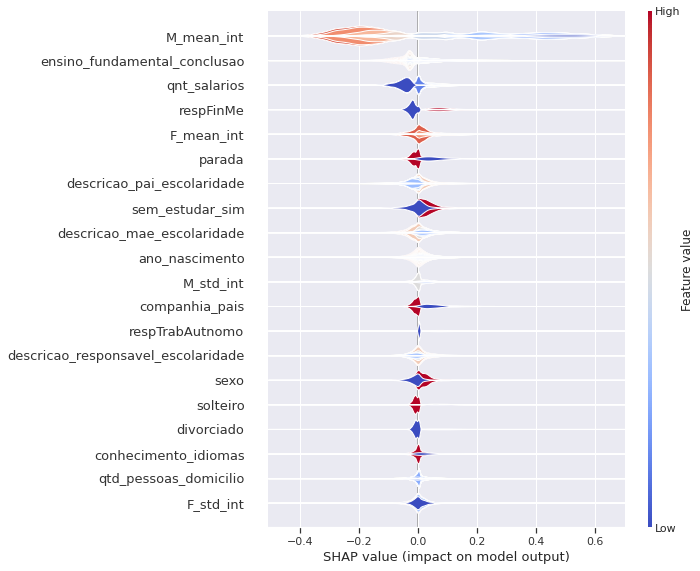

In [ ]:
shap.summary_plot(shap_values_test[1], X_test, plot_type="layered_violin")

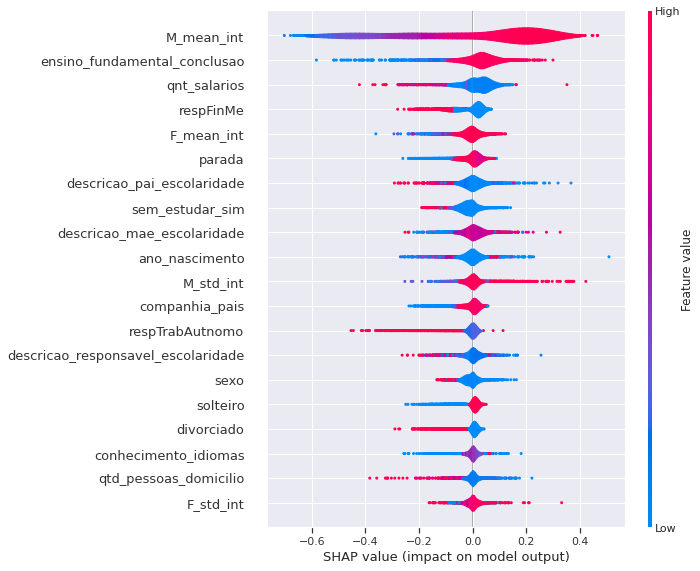

In [ ]:
shap.summary_plot(shap_values_test[0], X_test, plot_type="violin")

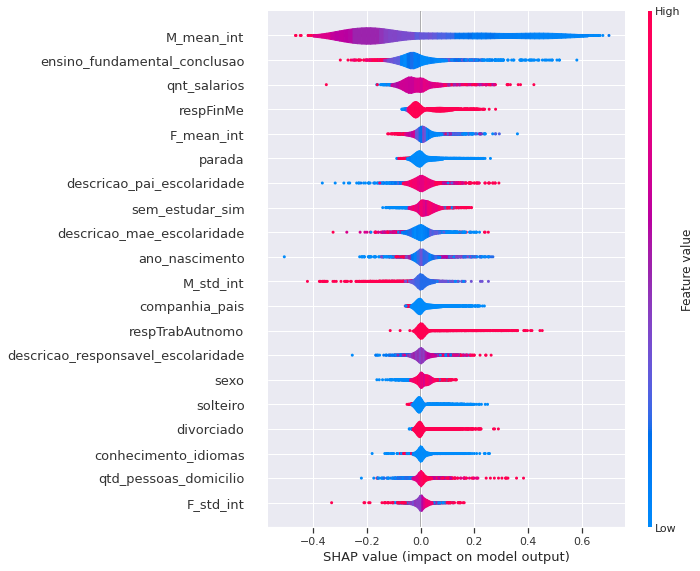

In [ ]:
shap.summary_plot(shap_values_test[1], X_test, plot_type="violin")

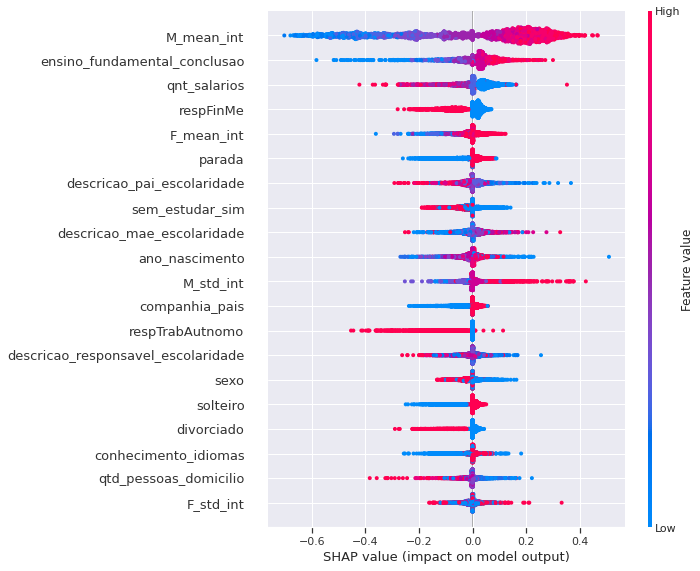

In [ ]:
shap.summary_plot(shap_values_test[0], X_test)

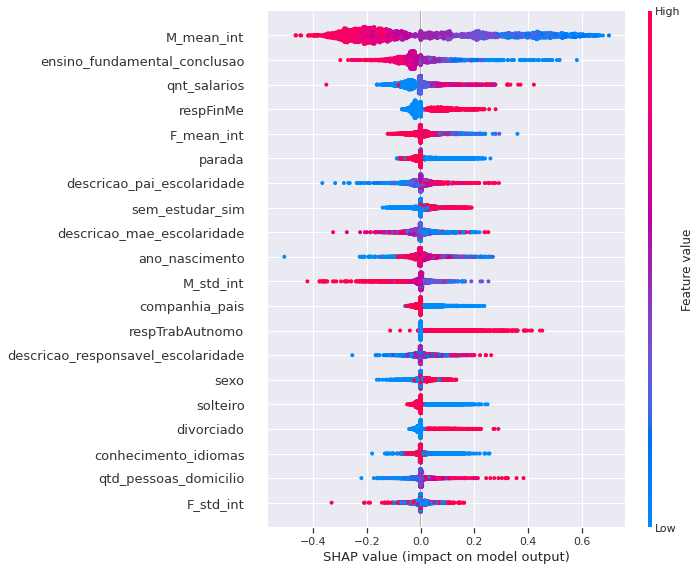

In [ ]:
shap.summary_plot(shap_values_test[1], X_test)

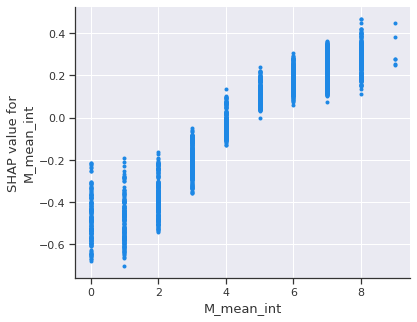

In [ ]:
shap.dependence_plot("M_mean_int",shap_values_test[0],X_test,interaction_index=None)

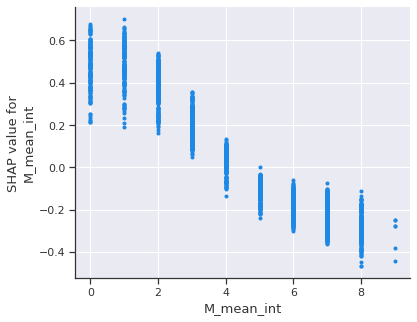

In [ ]:
shap.dependence_plot("M_mean_int",shap_values_test[1],X_test,interaction_index=None)

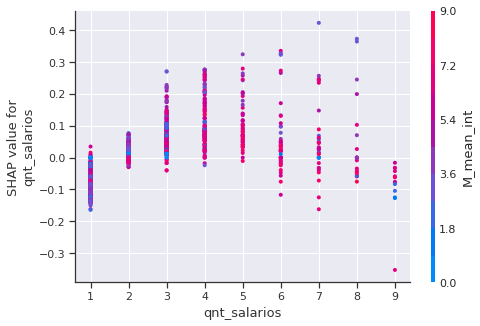

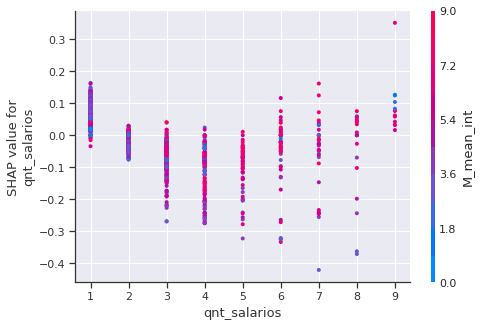

In [ ]:
shap.dependence_plot("qnt_salarios",shap_values_test[1],X_test,interaction_index='M_mean_int')
shap.dependence_plot("qnt_salarios",shap_values_test[0],X_test,interaction_index='M_mean_int')

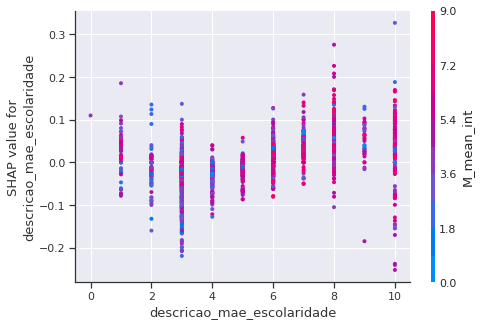

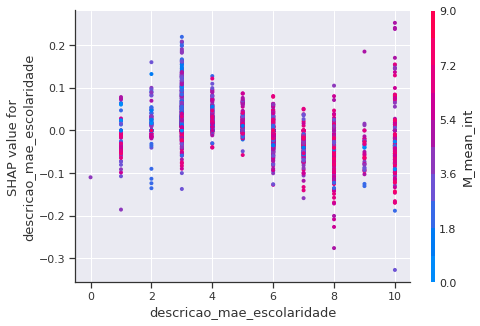

In [ ]:
shap.dependence_plot("descricao_mae_escolaridade",shap_values_test[0],X_test,interaction_index='M_mean_int')
shap.dependence_plot("descricao_mae_escolaridade",shap_values_test[1],X_test,interaction_index='M_mean_int')

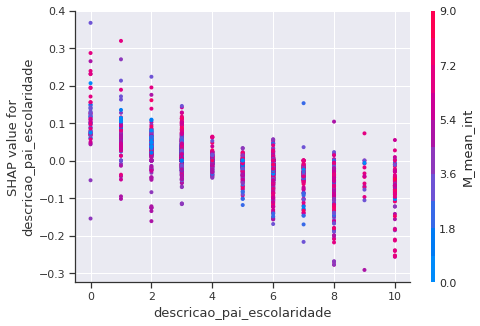

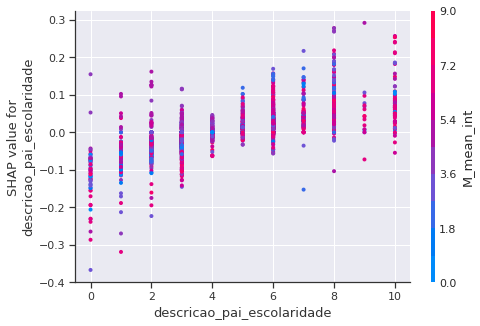

In [ ]:
shap.dependence_plot("descricao_pai_escolaridade",shap_values_test[0],X_test,interaction_index='M_mean_int')
shap.dependence_plot("descricao_pai_escolaridade",shap_values_test[1],X_test,interaction_index='M_mean_int')

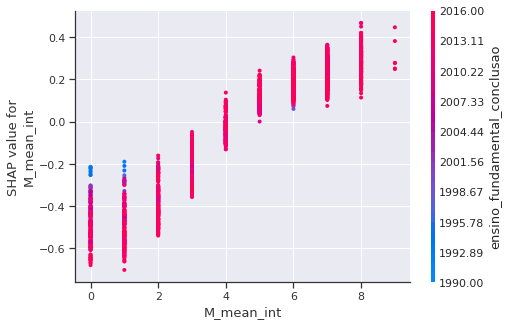

In [ ]:
shap.dependence_plot("M_mean_int",shap_values_test[0],X_test,interaction_index='auto')

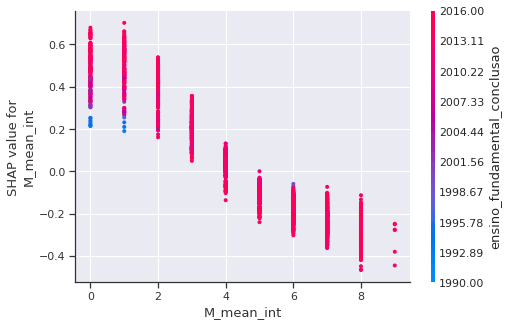

In [ ]:
shap.dependence_plot("M_mean_int",shap_values_test[1],X_test,interaction_index='auto')